In [1]:
################################################################################
####################    Regression: Linear Regression    #######################
################################################################################
### Load necessary modules -------------------------------
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
plt.style.use('ggplot')
import RegressionTools as RT
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn import set_config
set_config(display='diagram')

In [2]:
### Load file --------------------------------------------
df = pd.read_csv('insurance.csv', sep = ";")
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [3]:
### Convert necessary variable to factor
df.sex = df.sex.astype('category')
df.children = df.children.astype('category')
df.smoker = df.smoker.astype('category')
df.region = df.region.astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   age       1338 non-null   int64   
 1   sex       1338 non-null   category
 2   bmi       1338 non-null   float64 
 3   children  1338 non-null   category
 4   smoker    1338 non-null   category
 5   region    1338 non-null   category
 6   charges   1338 non-null   float64 
dtypes: category(4), float64(2), int64(1)
memory usage: 37.3 KB


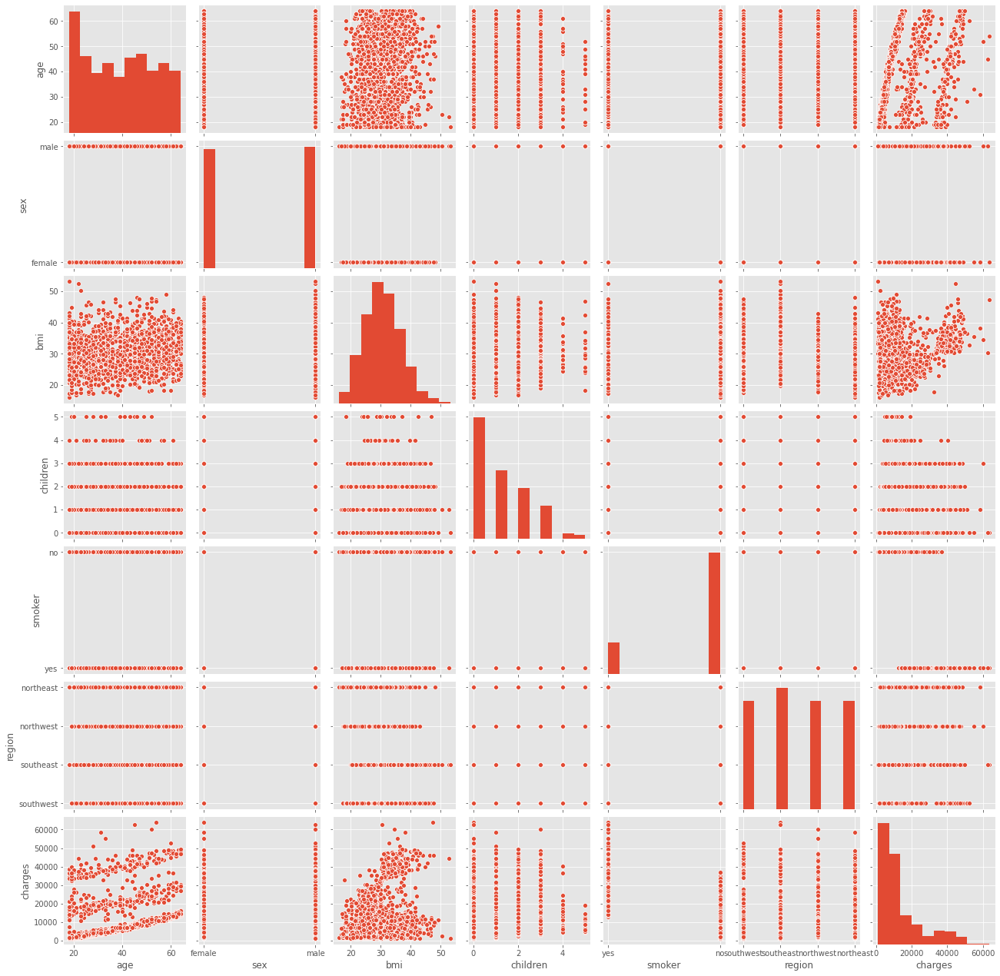

In [4]:
### Exploratory analysis -------------------------------------------------------------------------------------
sns.pairplot(df, vars=df.columns.values.tolist())
plt.show()

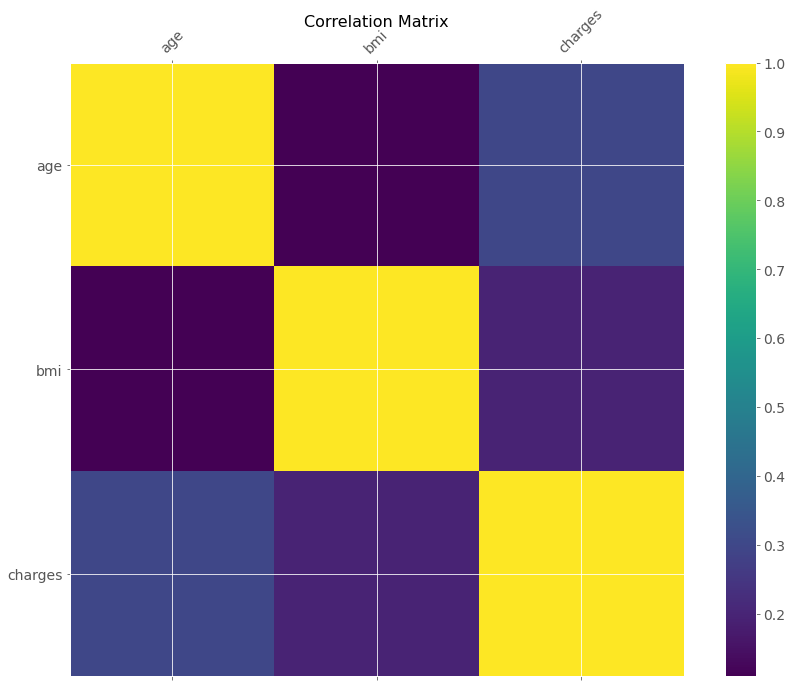

In [5]:
#correlation plot of numeric variables
f = plt.figure(figsize=(15, 11))
plt.matshow(df.select_dtypes(include=['int64','float64']).corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(include=['int64','float64']).shape[1]), df.select_dtypes(include=['int64','float64']).columns, fontsize=14, rotation=45)
plt.yticks(range(df.select_dtypes(include=['int64','float64']).shape[1]), df.select_dtypes(include=['int64','float64']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
plt.show()
#We can confirm that there is not a high LINEAR correlation between numeric inputs. 
#we can also see that age is more LINEARLY correlated to the output than bmi.

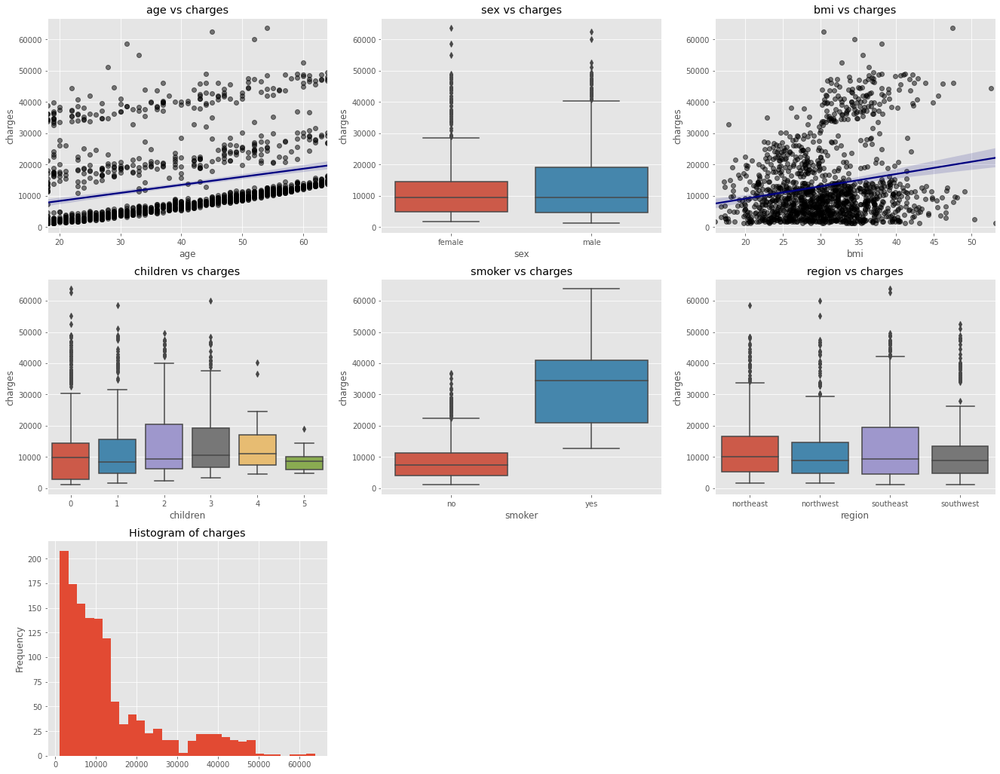

In [6]:
#To analyze in greater detail the relation between inputs and output, use PlotDataframe function
RT.PlotDataframe(df, 'charges')
# We can observe serveral effects from these plots:
# - Smoker seems a relevant variable looking at the boxplots. If smoker=yes, charges are higher.
# - We confirm the linear correlation between age and charges, although we can see that there seems 
#   to be 3 different behaviors. These should be explained by a factor variable. Also, the effects
#   seem to be a displacement on the level of charges. Therefore, interactions might not be needed in this case.
# - We see that bmi is related to charges, but there also appear to be different behaviors.
#   In this case, the effect of bmi on charges changes slope between behaviors. Interaction might be needed.

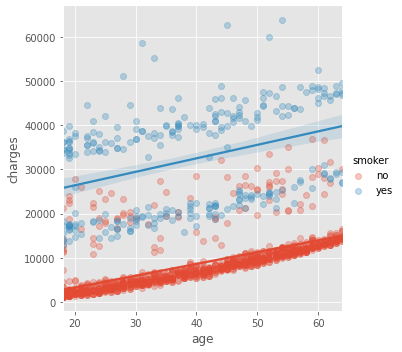

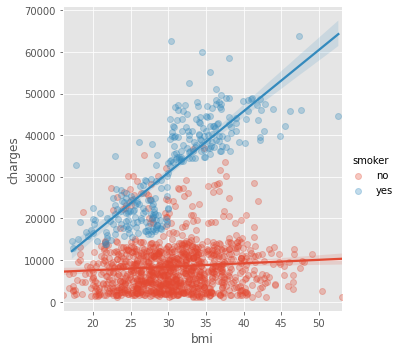

In [7]:
#plotting bmi and ages against charges and grouping by smoker, 
#we can see that these different behavior are greatly explained by this variable
#(we have included regression lines per category)
sns.lmplot(x='age', y='charges', hue='smoker', data=df, scatter_kws={'alpha':0.3})
plt.show()
sns.lmplot(x='bmi', y='charges', hue='smoker', data=df, scatter_kws={'alpha':0.3})
plt.show()

In [8]:
X = df[['age','bmi','children','sex','smoker','region']]
y = df['charges']
## Divide the data into training and test sets ---------------------------------------------------
## Create random 80/20 % split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 5)

## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['charges'] = y_train
dfTS_eval = X_test.copy()
dfTS_eval['charges'] = y_test

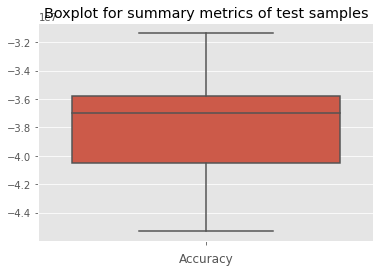

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['age',
                                                                          'bmi']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['children',
                                                                          'sex',
                                                                          'smoker',
                                                                          'region'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [9]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR_fit.fit(X_train, y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR1 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR_fit

In [10]:
RT.summaryLinReg(LR_fit.best_estimator_, X_train, y_train)  #information about the model trained
#Reference group: sex=female, smoker=no, region=northeast, children=0
#We observed several variables and categories that are not significant (pvalues > 0.05) 

Residuals:
            Min           1Q      Median           3Q           Max
0 -11775.277079 -3106.736276 -1048.09006  1461.362111  24593.558676

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.745
Model:                            OLS   Adj. R-squared:                  0.742
Method:                 Least Squares   F-statistic:                     257.1
Date:                Mon, 17 Aug 2020   Prob (F-statistic):          2.69e-303
Time:                        12:55:57   Log-Likelihood:                -10842.
No. Observations:                1070   AIC:                         2.171e+04
Df Residuals:                    1057   BIC:                         2.177e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t

In [11]:

X_processed = LR_fit.best_estimator_[0].transform(X_train)
if X_train.select_dtypes('category').shape[1] > 0:
    column_init = X_train.select_dtypes(exclude='category').shape[1]
    input_names = []
    for cat_input in X_train.select_dtypes('category').columns:
        input_names += [cat_input + str(cat) for cat in X_train[cat_input].unique()]
        input_names.pop()
        X_processed = np.delete(X_processed,column_init+len(input_names),1)
    coefnames = X_train.select_dtypes(exclude='category').columns.values.tolist() + input_names
else:
    coefnames = X_train.columns.values.tolist()
#Identify correlated variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_processed, i) for i in range(X_processed.shape[1])]
vif["features"] = coefnames
vif.round(1)
#No vif>10, there is not multicolineality present in the model

,VIF Factor,features
0,1.0,age
1,1.1,bmi
2,4.1,children1
3,2.8,children0
4,2.3,children2
5,1.9,children3
6,1.1,children4
7,2.0,sexmale
8,4.7,smokerno
9,2.0,regionsouthwest


In [12]:
dfTR_eval['LR_pred'] = LR_fit.predict(X_train)
dfTS_eval['LR_pred'] = LR_fit.predict(X_test)

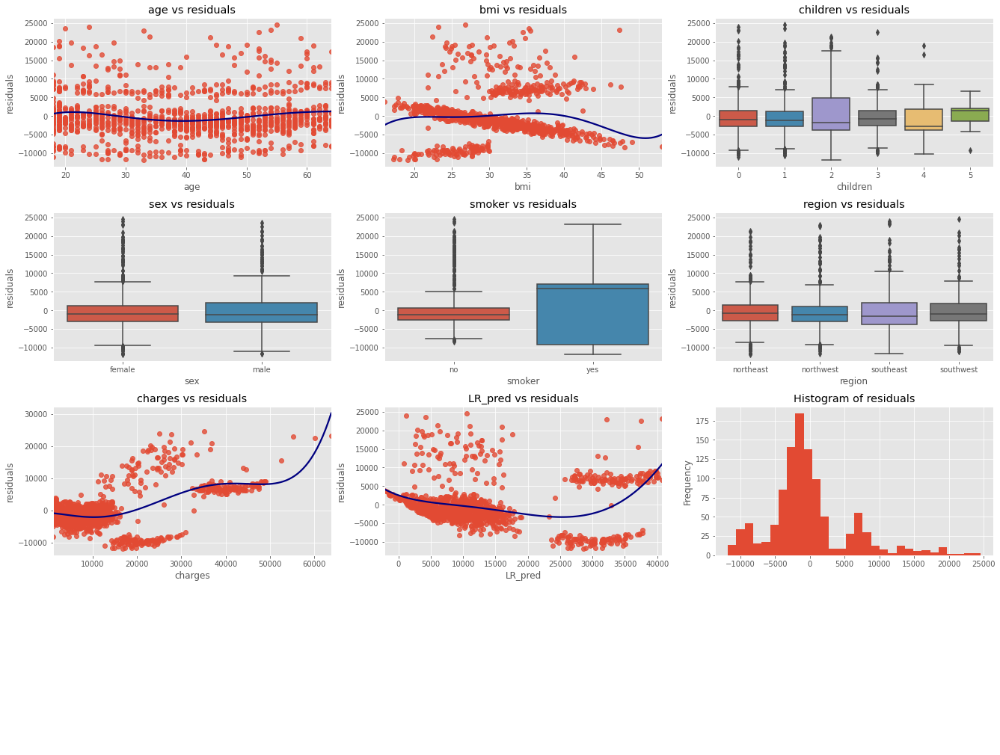

In [13]:
#Analysis of residuals
RT.plotModelDiagnosis(dfTR_eval, 'LR_pred', 'charges')
#We can see that residuals depend on bmi values. The behavior with bmi<30 seems to be different than for bmi>30
#The residuals vs age suggests that age might have a cuadratic behavior.

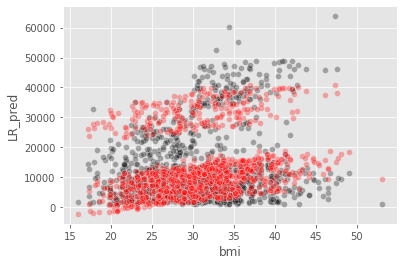

In [14]:
#Plot charges vs bmi
plt.figure()
sns.scatterplot(x='bmi', y='charges', data=dfTR_eval, alpha=0.3, color='black')
sns.scatterplot(x='bmi', y='LR_pred', data=dfTR_eval, alpha=0.3, color='red')
plt.show()
#Notice that, as there is no interaction, smoker only changes the level, but not the slope

In [15]:
#Training and test errors
print('Training RMSE:',mean_squared_error(dfTR_eval.charges, dfTR_eval.LR_pred))
print('Test RMSE:',mean_squared_error(dfTS_eval.charges, dfTS_eval.LR_pred))


Training RMSE: 37009191.04278555
Test RMSE: 34067444.98890532


In [16]:
## Divide the data into training and test sets ---------------------------------------------------
## Create random 80/20 % split
X_train['age2'] = X_train['age']**2
X_test['age2'] = X_test['age']**2

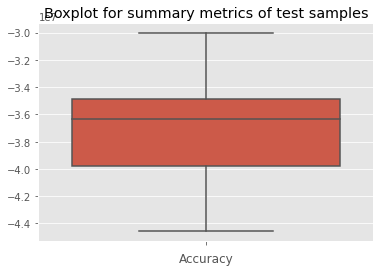

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['bmi',
                                                                          'age',
                                                                          'age2']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['children',
                                                                          'smoker'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [17]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
numeric_features = ['bmi','age','age2']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = ['children','smoker']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR2_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR2_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR2_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR2_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR2 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR2_fit

In [18]:
RT.summaryLinReg(LR2_fit.best_estimator_, X_train[numeric_features + categorical_features], y_train)  #information about the model trained
#bmi is significant
#age is not significant, only age^2

Residuals:
            Min           1Q       Median           3Q           Max
0 -12737.468316 -3083.181074 -1010.778906  1470.438825  24862.441044

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.748
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     314.7
Date:                Mon, 17 Aug 2020   Prob (F-statistic):          7.13e-309
Time:                        12:56:04   Log-Likelihood:                -10834.
No. Observations:                1070   AIC:                         2.169e+04
Df Residuals:                    1059   BIC:                         2.175e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t   

In [19]:
dfTR_eval['LR2_pred'] = LR2_fit.predict(X_train)
dfTS_eval['LR2_pred'] = LR2_fit.predict(X_test)

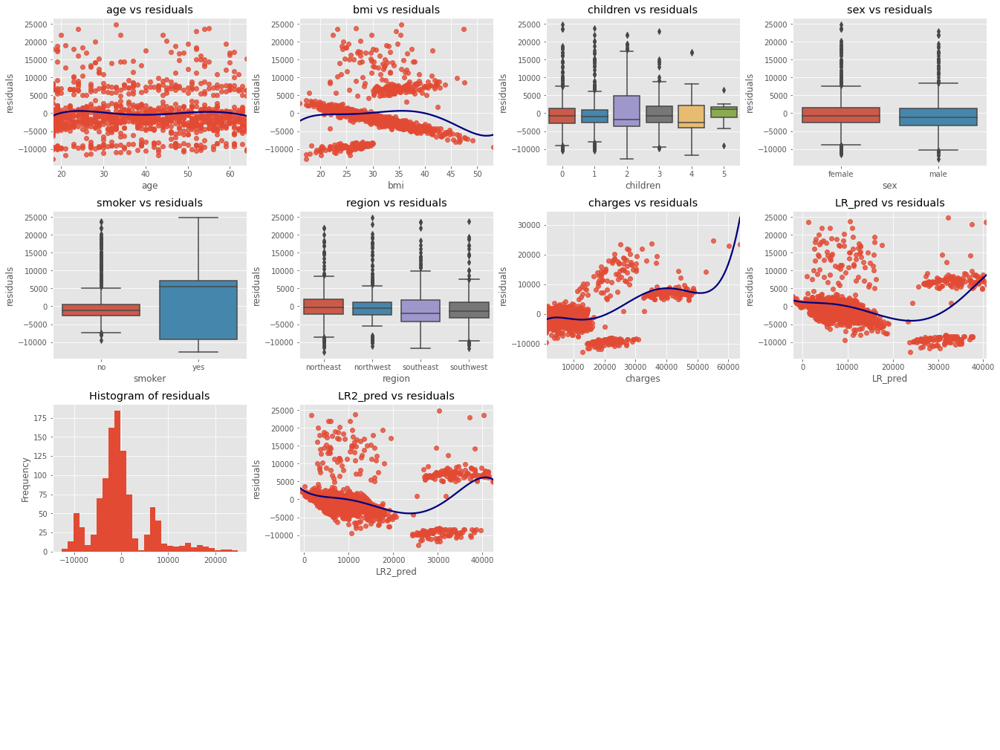

In [20]:
#Analysis of residuals
RT.plotModelDiagnosis(dfTR_eval, 'LR2_pred', 'charges')

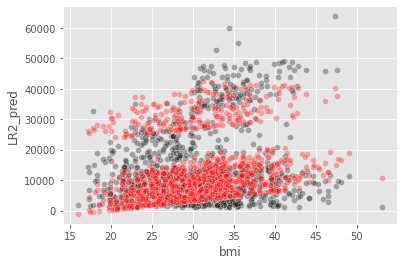

In [21]:
#Plot charges vs bmi
plt.figure()
sns.scatterplot(x='bmi', y='charges', data=dfTR_eval, alpha=0.3, color='black')
sns.scatterplot(x='bmi', y='LR2_pred', data=dfTR_eval, alpha=0.3, color='red')
plt.show()
#Not much change appreciated

In [22]:
#Training and test errors
print('Training RMSE:',mean_squared_error(dfTR_eval.charges, dfTR_eval.LR2_pred))
print('Test RMSE:',mean_squared_error(dfTS_eval.charges, dfTS_eval.LR2_pred))

Training RMSE: 36490506.38312223
Test RMSE: 34670476.34043887


In [23]:
# Next model introducing interaction
X_train = pd.concat([X_train.reset_index(), pd.DataFrame(X_train['bmi'].to_numpy().reshape(X_train.shape[0],1) * pd.get_dummies(X_train['smoker']).to_numpy(), columns=['bmi_smokerno','bmi_smokeryes'])], axis=1)
X_test = pd.concat([X_test.reset_index(), pd.DataFrame(X_test['bmi'].to_numpy().reshape(X_test.shape[0],1) * pd.get_dummies(X_test['smoker']).to_numpy(), columns=['bmi_smokerno','bmi_smokeryes'])], axis=1)

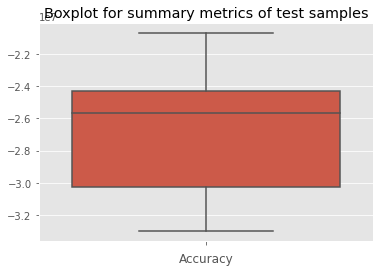

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['age',
                                                                          'age2',
                                                                          'bmi_smokerno',
                                                                          'bmi_smokeryes']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['children'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [24]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
numeric_features = ['age','age2','bmi_smokerno','bmi_smokeryes']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = ['children']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR3_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR3_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR3_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR3_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR3 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR3_fit

In [25]:
RT.summaryLinReg(LR3_fit.best_estimator_, X_train[numeric_features + categorical_features], y_train)  #information about the model trained


Residuals:
           Min           1Q       Median          3Q           Max
0 -9719.112058 -2252.966044 -1024.828883  173.892884  23172.747892

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.819
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     532.7
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        12:56:12   Log-Likelihood:                -10658.
No. Observations:                1070   AIC:                         2.134e+04
Df Residuals:                    1060   BIC:                         2.139e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t    

In [26]:
dfTR_eval['LR3_pred'] = LR3_fit.predict(X_train)
dfTS_eval['LR3_pred'] = LR3_fit.predict(X_test)

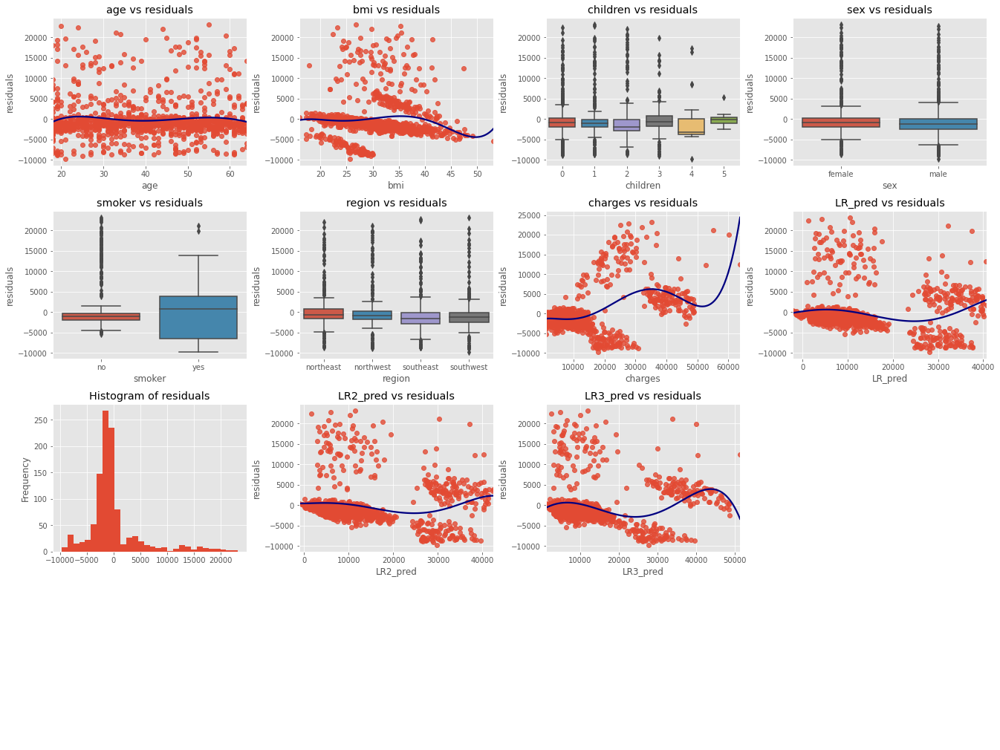

In [27]:
#Analysis of residuals
RT.plotModelDiagnosis(dfTR_eval, 'LR3_pred', 'charges')
#bmi still shows different behaviors

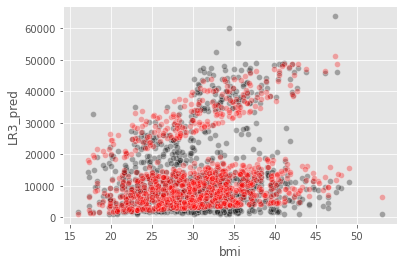

In [28]:
#Plot charges vs bmi
plt.figure()
sns.scatterplot(x='bmi', y='charges', data=dfTR_eval, alpha=0.3, color='black')
sns.scatterplot(x='bmi', y='LR3_pred', data=dfTR_eval, alpha=0.3, color='red')
plt.show()
#interaction changes slope with smoker, but same for all bmi

In [29]:
#We want to create a 0-1 variable for determining if we are in the case when bmi>30 or not
X_train['bmi30'] = X_train['bmi'] > 30
X_train['bmi30'] = X_train['bmi30'].astype(int)
X_test['bmi30'] = X_test['bmi'] > 30
X_test['bmi30'] = X_test['bmi30'].astype(int)

X_train = pd.concat([X_train.reset_index(), pd.DataFrame(X_train['bmi30'].to_numpy().reshape(X_train.shape[0],1) * pd.get_dummies(X_train['smoker']).to_numpy(), columns=['bmi30_smokerno','bmi30_smokeryes'])], axis=1)
X_test = pd.concat([X_test.reset_index(), pd.DataFrame(X_test['bmi30'].to_numpy().reshape(X_test.shape[0],1) * pd.get_dummies(X_test['smoker']).to_numpy(), columns=['bmi30_smokerno','bmi30_smokeryes'])], axis=1)

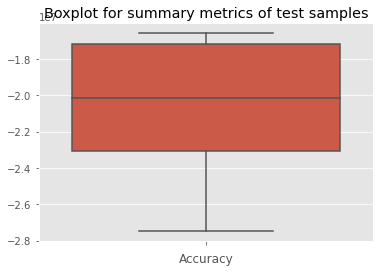

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['age',
                                                                          'age2',
                                                                          'bmi_smokerno',
                                                                          'bmi_smokeryes',
                                                                          'bmi30_smokerno',
                                                                          'bmi30_smokeryes']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['children'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [30]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
numeric_features = ['age','age2','bmi_smokerno','bmi_smokeryes','bmi30_smokerno','bmi30_smokeryes']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = ['children']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR4_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR4_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR4_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR4_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR4 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR4_fit

In [31]:
RT.summaryLinReg(LR4_fit.best_estimator_, X_train[numeric_features + categorical_features], y_train)  #information about the model trained

Residuals:
           Min           1Q       Median          3Q           Max
0 -4143.681801 -1699.638884 -1243.052753 -682.328433  23249.949009

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.863
Model:                            OLS   Adj. R-squared:                  0.861
Method:                 Least Squares   F-statistic:                     603.5
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        12:56:19   Log-Likelihood:                -10511.
No. Observations:                1070   AIC:                         2.105e+04
Df Residuals:                    1058   BIC:                         2.110e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t  

In [32]:
dfTR_eval['LR4_pred'] = LR4_fit.predict(X_train)
dfTS_eval['LR4_pred'] = LR4_fit.predict(X_test)

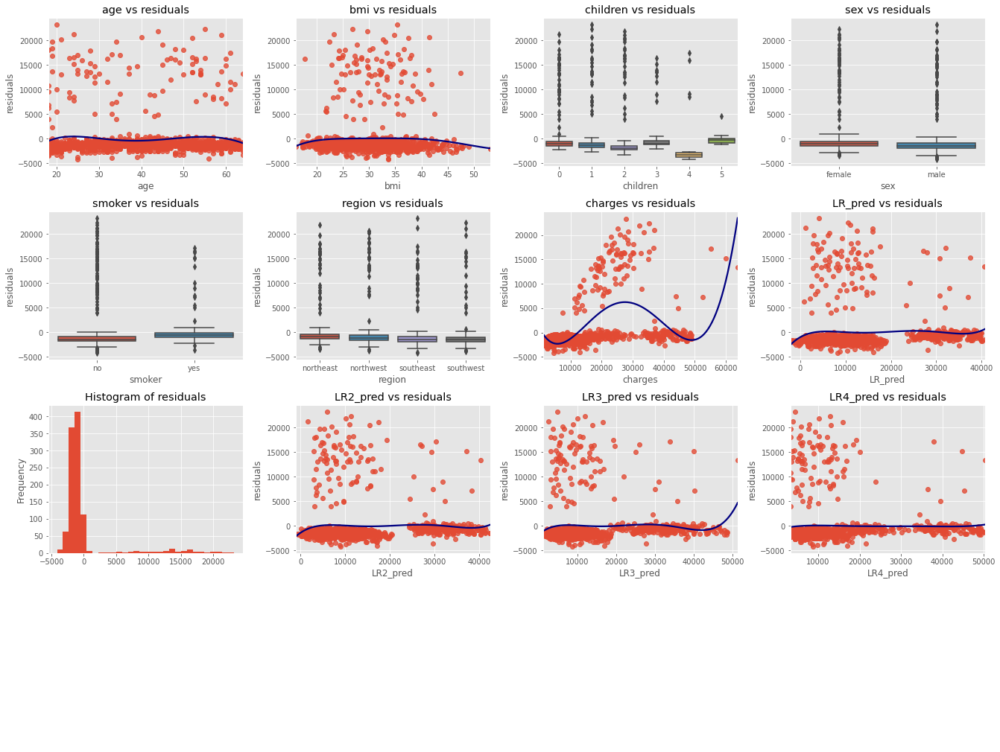

In [33]:
#Analysis of residuals
RT.plotModelDiagnosis(dfTR_eval, 'LR4_pred', 'charges')
#bmi shows a different behavior, but this one is not explained by any input variable 

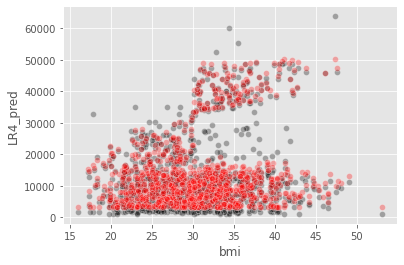

In [34]:
#Plot charges vs bmi
plt.figure()
sns.scatterplot(x='bmi', y='charges', data=dfTR_eval, alpha=0.3, color='black')
sns.scatterplot(x='bmi', y='LR4_pred', data=dfTR_eval, alpha=0.3, color='red')
plt.show()
#interaction changes slope with smoker and bmi30

In [35]:
#if we consider those extrange values as outliers:
outlierRes = abs(dfTR_eval['charges'] - dfTR_eval['LR4_pred'])<3000
X_train_filtered = X_train[outlierRes.to_numpy()]
y_train_filtered = y_train[outlierRes.to_numpy()]
outlierRes = abs(dfTS_eval['charges'] - dfTS_eval['LR4_pred'])<3000
X_test_filtered = X_test[outlierRes.to_numpy()]
y_test_filtered = y_test[outlierRes.to_numpy()]

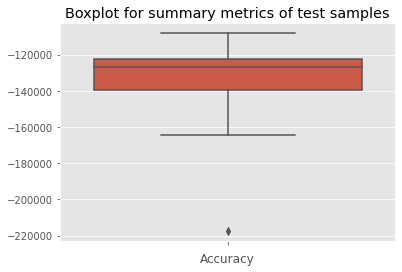

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['age',
                                                                          'age2',
                                                                          'bmi_smokerno',
                                                                          'bmi_smokeryes',
                                                                          'bmi30_smokerno',
                                                                          'bmi30_smokeryes']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['children'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [36]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
numeric_features = ['age','age2','bmi_smokerno','bmi_smokeryes','bmi30_smokerno','bmi30_smokeryes']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = ['children']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR5_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR5_fit.fit(X_train_filtered[numeric_features + categorical_features], y_train_filtered) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR5_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR5_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR5 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR5_fit

In [37]:
RT.summaryLinReg(LR5_fit.best_estimator_, X_train_filtered[numeric_features + categorical_features], y_train_filtered)  #information about the model trained

Residuals:
          Min          1Q     Median          3Q          Max
0 -704.431643 -260.823405 -15.136503  264.088383  2989.106028

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 8.786e+04
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        12:56:26   Log-Likelihood:                -7023.1
No. Observations:                 959   AIC:                         1.407e+04
Df Residuals:                     947   BIC:                         1.413e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t| 

In [38]:
dfTR_eval['LR5_pred'] = LR5_fit.predict(X_train)
dfTS_eval['LR5_pred'] = LR5_fit.predict(X_test)

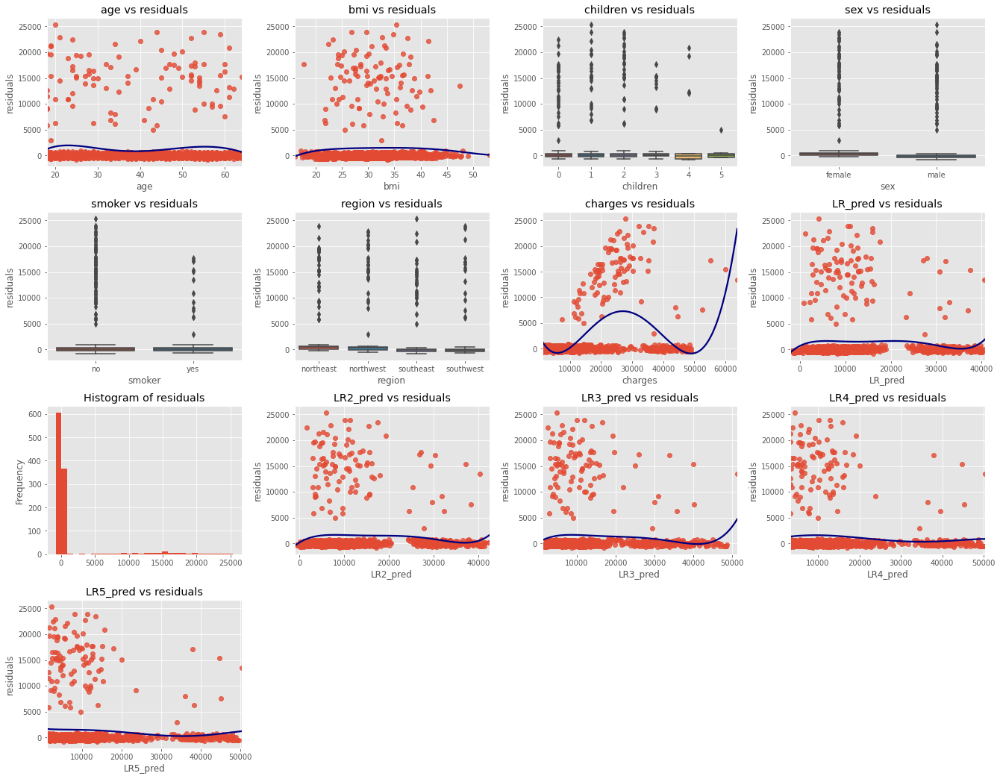

In [39]:
#Analysis of residuals
RT.plotModelDiagnosis(dfTR_eval, 'LR5_pred', 'charges')
#¿Is it ok?

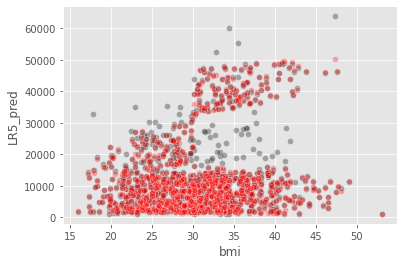

In [40]:
#Plot charges vs bmi
plt.figure()
sns.scatterplot(x='bmi', y='charges', data=dfTR_eval, alpha=0.3, color='black')
sns.scatterplot(x='bmi', y='LR5_pred', data=dfTR_eval, alpha=0.3, color='red')
plt.show()
#Review fit. All points are modeled except those that are outliers

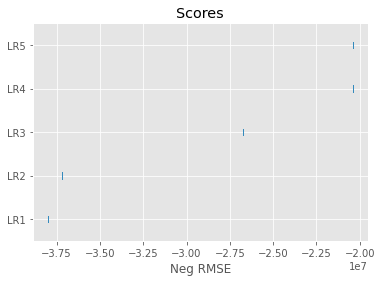

In [42]:
## Compare models
metric = 'Neg RMSE'
score = {'LR1': scores_LR1, 'LR2': scores_LR2, 'LR3': scores_LR3, 'LR4': scores_LR4, 'LR5': scores_LR4}
RT.dotplot(score, metric)